<a href="https://colab.research.google.com/github/AbimaelLopez/Diplomado/blob/main/11_K_means_ejercicio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **11. K means**

### Objetivos
Que la o el estudiante conozca los conceptos relacionados con el algoritmo no supervisado para agrupamiento K-medias y su uso con la biblioteca Scikit learn.

### Descripción del procedimiento a seguir
- Se utiliza el algoritmo K-means con datos sintéticos.
- Se utiliza el método *elbow* para elegir el mejor valor de $k$
- Se utiliza K-means con el conjunto de datos Iris
- Se utiliza K-means con un conjunto de imagenes denominado MNIST digits


### Datos
**Profesora**: Dra. Jessica Beltrán Márquez<br>
Maestría en Ciencia de Datos y Optimización<br>
Centro de Investigación en Matemáticas Aplicadas <br>
Universidad Autónoma de Coahuila


### Bibliografía
1. https://es.wikipedia.org/wiki/Base_de_datos_MNIST


## **1. Importar bibliotecas**

In [1]:
#Básicas para manipulación de datos
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

#Para obtener conjuntos de datos
from sklearn import datasets

#Con la implementación de k-medias
from sklearn.cluster import KMeans


## **2. Uso de K-medias para trabajar con datos sintéticos en dos dimensiones**
En esta sección, vamos a utilizar 2 conjuntos de datos sintéticos en dos dimensiones. El código se reutilizará para ambos conjuntos.

### **2.1 Lectura del conjunto de datos**

In [2]:
df = pd.read_csv('/content/2Clusters.csv')
#Este es el otro conjunto que utilizaremos
#df = pd.read_csv('/content/drive/MyDrive/Curso ML Diplomado/11 Kmeans/3Clusters.csv')
df.head()

,x,y,Class
0,0.106163,0.880407,C1
1,0.077910,0.760641,C1
2,0.100754,0.710661,C1
3,0.050074,0.768947,C1
4,0.134432,0.710871,C1


### **2.2 Gráfica tipo Scatter plot de los datos**
Se grafican las columnas $x$ y $y$ del conjunto de datos para mostrar la ubicación de cada elemento. Aunque en el conjunto de datos viene una columna llamada *Class* no la utilizamos, ya que estamos trabajando con un algoritmo no supervisado.

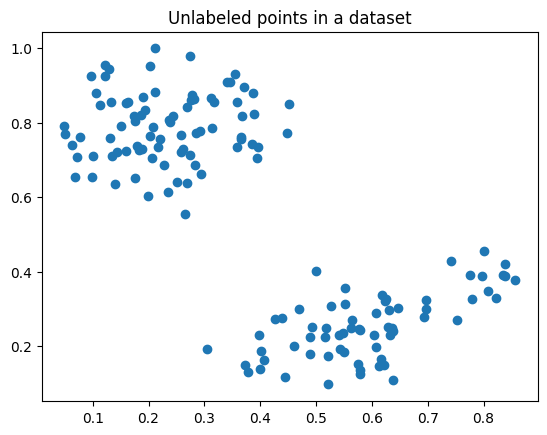

In [3]:
plt.scatter(df['x'],df['y'])
plt.title('Unlabeled points in a dataset')
plt.show()

### **2.3 Creamos la matriz con los vectores de características**
Para eso, nos deshacemos de la columna *Class*

In [4]:
X = df.drop(columns =['Class'])

### **2.4 Instanciamos un objeto de la clase KMeans y ajustamos a los datos**


*   Se define un valor de $k$ (empezaremos con dos, pero probaremos con otros valores).
*   Se inicializa el algoritmo de K-medias indicando el valor de $k$ clusters.
*  Se realiza el ajuste usando *fit*.



In [5]:
k = 2
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(X)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=2, random_state=42)

### **2.5 Imprimimos los resultados de usar K-medias**


*   Imprimimos que etiquetas se le asignó a cada punto
*   Imprimimos los centroides encontrados



In [6]:
labels = kmeans.labels_
print(labels)

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [7]:
centroids = kmeans.cluster_centers_
print(centroids)

[[0.59229592 0.25677106]
 [0.23055414 0.78667431]]


### **2.6 Graficamos los puntos y los centroides**


*   Se indica con un color distinto los cluster encontrados
*   Los centroides encontrados se representan con las cruces rojas



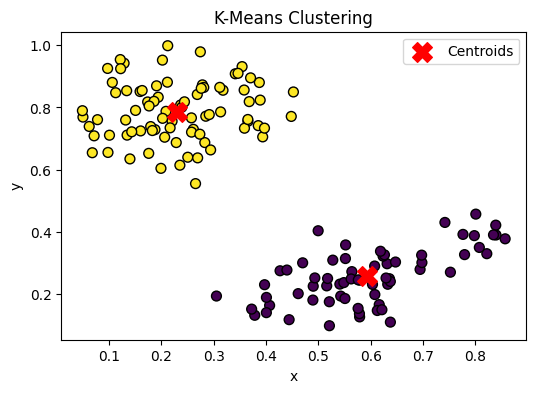

In [8]:
plt.figure(figsize=(6,4))
plt.scatter(X.iloc[:,0], X.iloc[:,1], c=labels, cmap='viridis', edgecolor='k', s=50)
plt.scatter(centroids[:,0], centroids[:,1], c='red',marker='X', s=200, label='Centroids')
plt.title('K-Means Clustering')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

## **2.7 Repite los pasos anteriores**

Repite los pasos anteriores probando diferentes valores de $k$ para los conjuntos de datos indicados (Checa los conjuntos en los comentarios).



## **3. Elección de $k$ con el método *elbow***

La implementación de K-means en la biblioteca Scikit learn, entrega un atributo denominado *inertia_float*, el cual es la suma de las distancias al cuadrado de todas las muestras a su centroide más cercano (ponderado si es el caso). Esto permite conocer el error de la elección de diferentes valores de $k$. Para ello, se utiliza la siguiente estrategia:


*   Se define un intervalo de valores de $k$ a evaluar
*   Se ajusta el algoritmo K-means con cada uno de los valores $k$.
*   Se almacena el valor de *intertia_float* de cada caso
*   Se grafica el valor *interia_float* y por medio de una inspección visual se elige aquel valor de $k$ en donde la gráfica se *dobla*.
*   Aplica nuevamente el algoritmo con el mejor valor de $k$ y grafica los resultados.


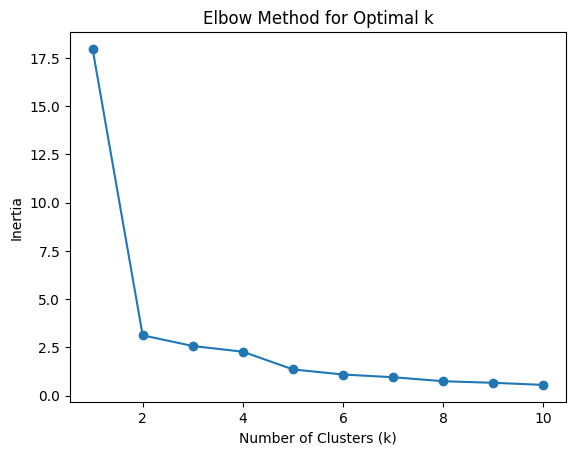

In [9]:
df = pd.read_csv('/content/2Clusters.csv')
X = df.drop(columns =['Class'])

# Find the optimal k using the elbow method
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, n_init='auto', random_state=42)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

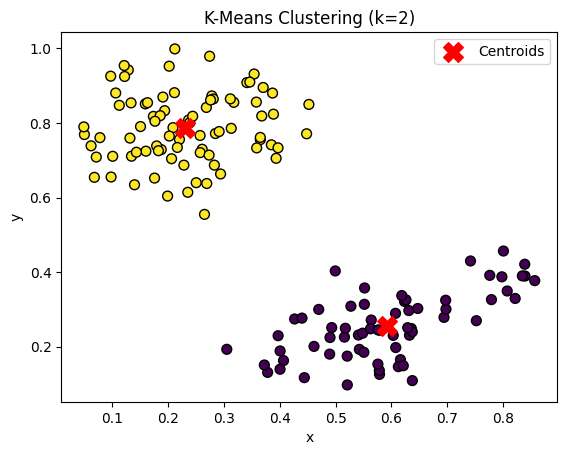

In [10]:
# Choose the optimal k based on the elbow point (visual inspection)
optimal_k = 2

# Perform k-means clustering with the optimal k
kmeans_optimal = KMeans(n_clusters=optimal_k, n_init = 'auto', random_state=42)
kmeans_optimal.fit(X)
labels_optimal = kmeans_optimal.labels_
centroids_optimal = kmeans_optimal.cluster_centers_

# Plot the results with optimal k
plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=labels_optimal, cmap='viridis', edgecolor='k', s=50)
plt.scatter(centroids_optimal[:, 0], centroids_optimal[:, 1], c='red', marker='X', s=200, label='Centroids')
plt.title(f'K-Means Clustering (k={optimal_k})')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

## **4. K-means en el conjunto de datos Iris**

En esta sección se utiliza el conjunto de datos Iris y se obtienen $k$ clusters con K-medias.

### **4.1 Carga de datos y separación para obtener la matriz X**

In [11]:
# Load the Iris dataset
iris = datasets.load_iris()
X = iris.data  # Features
y = iris.target  # Target variable (for coloring the points in the plot)

### **4.2 Uso de K-medias y elección de valor $k$**

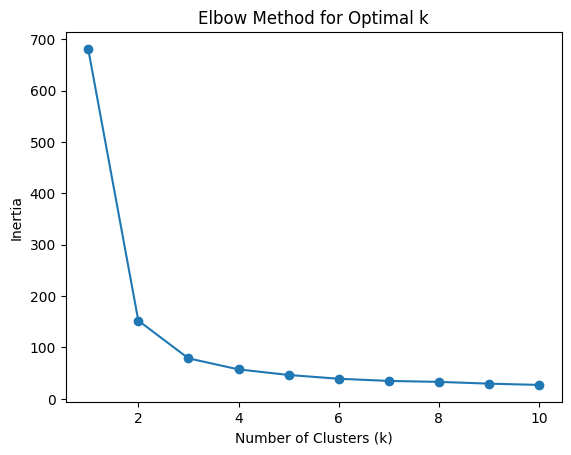

In [12]:
# Find the optimal k using the elbow method
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, n_init='auto', random_state=42)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

### **4.3 Elección de k y ajuste**

In [13]:
k = int(input("Ingresa un valor de k: "))

# Apply k-means with a specified number of clusters (k)

kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
kmeans.fit(X)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

Ingresa un valor de k: 4


In [15]:
iris.feature_names

['sepal length (cm)',
 'sepal width (cm)',
 'petal length (cm)',
 'petal width (cm)']

### **4.4 Graficar los puntos con sus clases originales y con los grupos encontrados con k-medias**

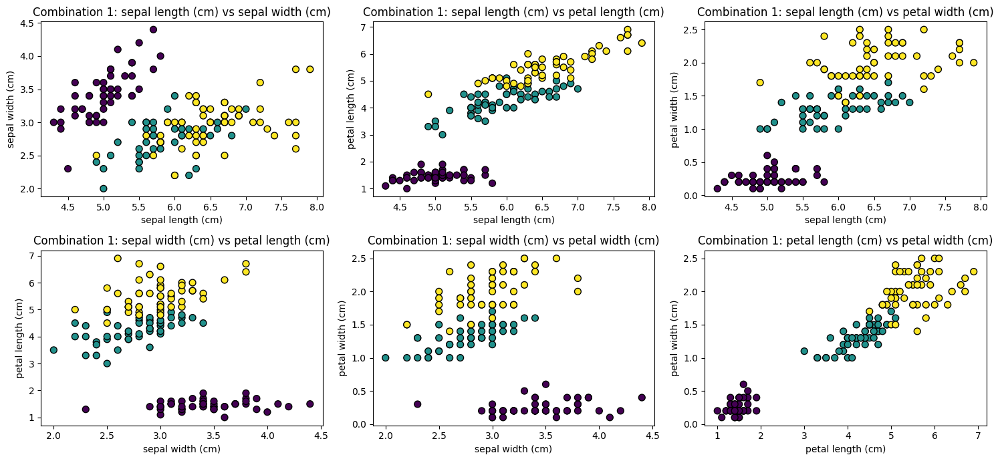

In [16]:
# Plot combinations of original features in 2D
plt.figure(figsize=(15, 7))

# Plot combination 1 (sepal length vs sepal width)
plt.subplot(2, 3, 1)
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+iris.feature_names[0] + ' vs ' + iris.feature_names[1])
plt.xlabel(iris.feature_names[0])
plt.ylabel(iris.feature_names[1])

# Plot combination 2 (sepal length vs petal length)
plt.subplot(2, 3, 2)
plt.scatter(X[:, 0], X[:, 2], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+iris.feature_names[0] + ' vs ' + iris.feature_names[2])
plt.xlabel(iris.feature_names[0])
plt.ylabel(iris.feature_names[2])

# Plot combination 3 (sepal length vs petal width)
plt.subplot(2, 3, 3)
plt.scatter(X[:, 0], X[:, 3], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+iris.feature_names[0] + ' vs ' + iris.feature_names[3])
plt.xlabel(iris.feature_names[0])
plt.ylabel(iris.feature_names[3])

plt.subplot(2, 3, 4)
plt.scatter(X[:, 1], X[:, 2], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+iris.feature_names[1] + ' vs ' + iris.feature_names[2])
plt.xlabel(iris.feature_names[1])
plt.ylabel(iris.feature_names[2])

# Plot combination 2 (sepal length vs petal length)
plt.subplot(2, 3, 5)
plt.scatter(X[:, 1], X[:, 3], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+iris.feature_names[1] + ' vs ' + iris.feature_names[3])
plt.xlabel(iris.feature_names[1])
plt.ylabel(iris.feature_names[3])

# Plot combination 3 (sepal length vs petal width)
plt.subplot(2, 3, 6)
plt.scatter(X[:, 2], X[:, 3], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+iris.feature_names[2] + ' vs ' + iris.feature_names[3])

plt.xlabel(iris.feature_names[2])
plt.ylabel(iris.feature_names[3])

plt.tight_layout()
plt.show()

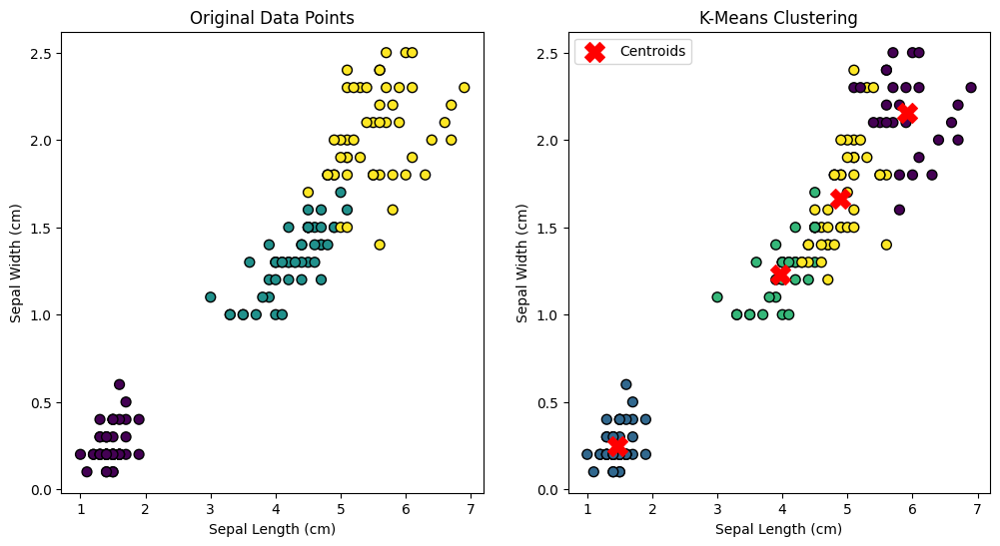

In [17]:

# Plot the original data points with colors based on the true labels
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(X[:, 2], X[:, 3], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Original Data Points')
plt.xlabel('Sepal Length (cm)')
plt.ylabel('Sepal Width (cm)')

# Plot the data points with colors based on the cluster assignments from k-means
plt.subplot(1, 2, 2)
plt.scatter(X[:, 2], X[:, 3], c=labels, cmap='viridis', edgecolor='k', s=50)
plt.scatter(centroids[:, 2], centroids[:, 3], c='red', marker='X', s=200, label='Centroids')
plt.title('K-Means Clustering')
plt.xlabel('Sepal Length (cm)')
plt.ylabel('Sepal Width (cm)')
plt.legend()

plt.show()


## **5. Agrupamiento de un conjunto de datos de imágenes**

* Descargamos el conjunto de datos MNIST digits usando la biblioteca Scikit learn
* Obtenemos la matrix X
* Obtenemos el vector y, solo para comparación, porque en aprendizaje no supervisado no se requiere.
* Definimos una función para llevar a cabo el agrupamiento
* Definimos una función para graficar como se ven los grupos

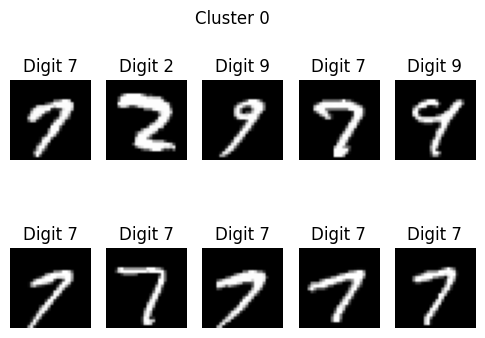

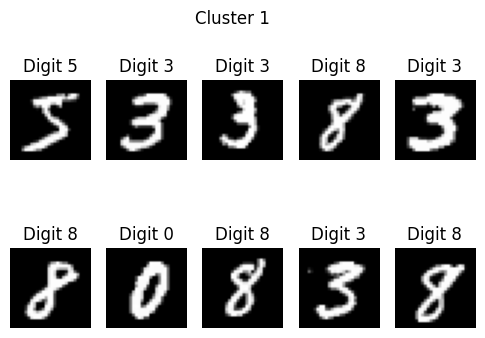

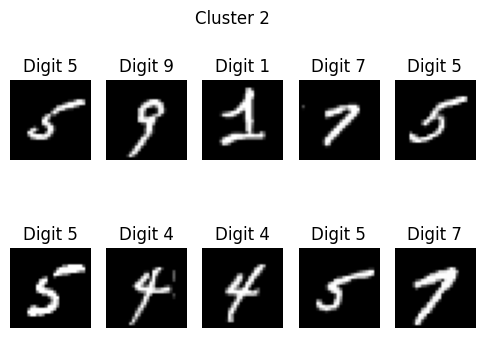

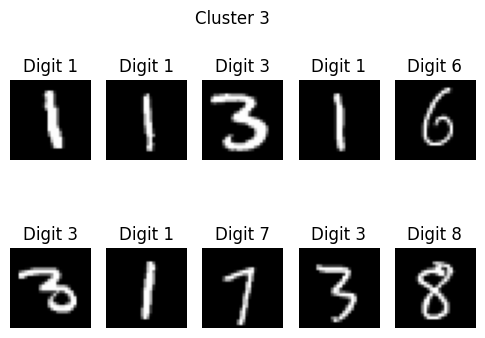

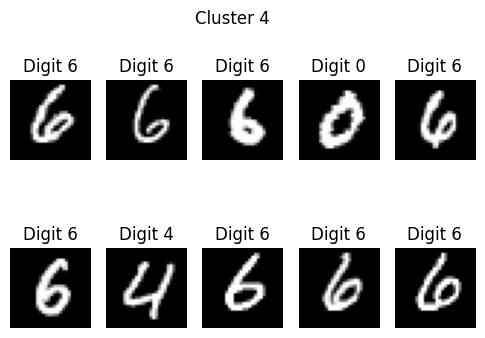

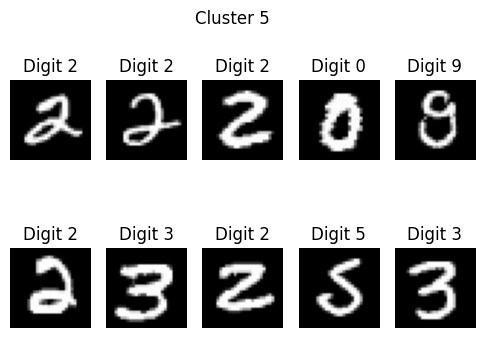

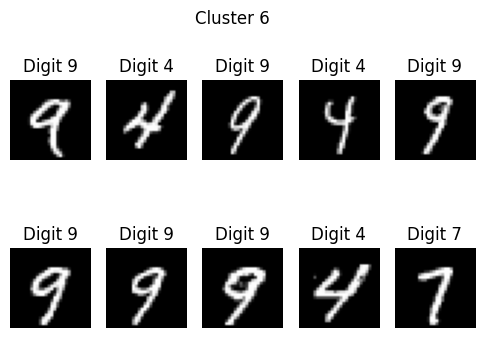

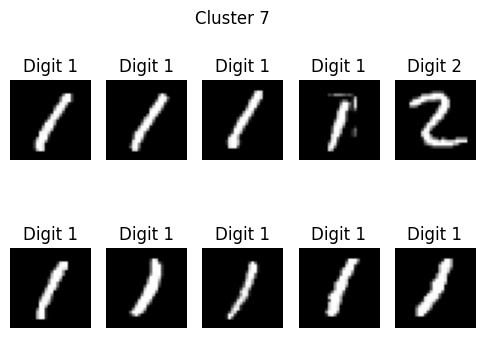

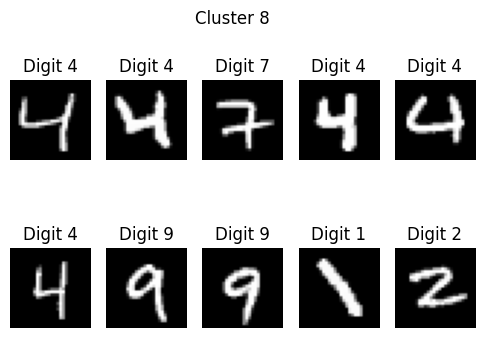

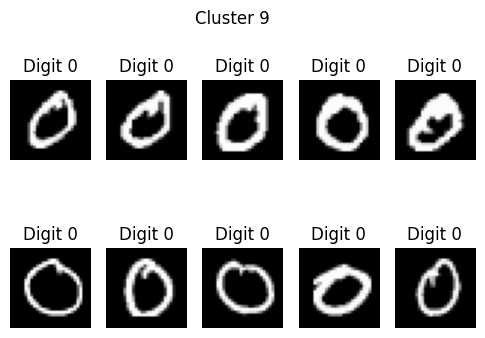

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA

# Load MNIST dataset
mnist = fetch_openml('mnist_784', version=1, cache=True, parser='auto')
X = np.array(mnist.data.astype('float32'))
y = np.array(mnist.target.astype('int'))

# Choose a subset of the dataset to speed up processing
subset_size = 500
X_subset = X[:subset_size]
y_subset = y[:subset_size]

# Function to perform k-means clustering
def kmeans_clustering(X, k):
    kmeans = KMeans(n_clusters=k, random_state=0, n_init = 'auto')
    kmeans.fit(X)
    labels = kmeans.labels_
    return labels

# Function to visualize digits within the same cluster
def visualize_cluster_digits(X, labels, cluster_num):
    cluster_indices = np.where(labels == cluster_num)[0]

    plt.figure(figsize=(6, 4))
    for i, idx in enumerate(cluster_indices[:10]):  # Display up to 10 digits per cluster
        plt.subplot(2, 5, i + 1)
        plt.imshow(X[idx].reshape(28, 28), cmap='gray')
        plt.title(f'Digit {y_subset[idx]}')
        plt.axis('off')

    plt.suptitle(f'Cluster {cluster_num} \n')
    plt.show()

# Choose a specific k value
k_value = 10

# Perform k-means clustering
cluster_labels = kmeans_clustering(X_subset, k_value)

# Visualize digits within each cluster
for cluster_num in range(k_value):
    visualize_cluster_digits(X_subset, cluster_labels, cluster_num)


## **6. Ejercicio, Agrupamiento en el conjunto de datos de vinos**
* Usa el conjunto de datos de vinos, el cual esta dentro de Scikitlearn. Busca en datasets como leerlos.
* Utiliza el algoritmo de K-medias para hacer un agrupamiento.
* Prueba distintos valores de k
* Con fines de comparación, al igual que en el Iris dataset, grafica con color las clases originales de los objetos y con color los grupos que se encontraron.
* Responde, ¿Tiene algún impacto escalar los datos en este problema?

In [20]:
from sklearn.datasets import load_wine
wine = load_wine()

X = wine.data  # Features
y = wine.target  # Target variable (for coloring the points in the plot)

In [23]:
wine.feature_names

['alcohol',
 'malic_acid',
 'ash',
 'alcalinity_of_ash',
 'magnesium',
 'total_phenols',
 'flavanoids',
 'nonflavanoid_phenols',
 'proanthocyanins',
 'color_intensity',
 'hue',
 'od280/od315_of_diluted_wines',
 'proline']

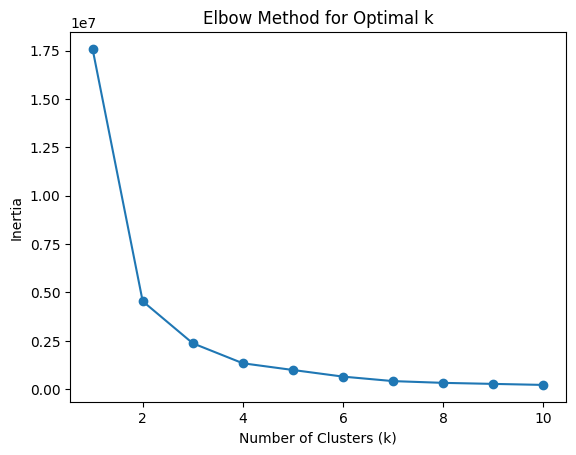

In [24]:

inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, n_init='auto', random_state=42)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

In [54]:
k = 3

# Apply k-means with a specified number of clusters (k)

kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
kmeans.fit(X)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

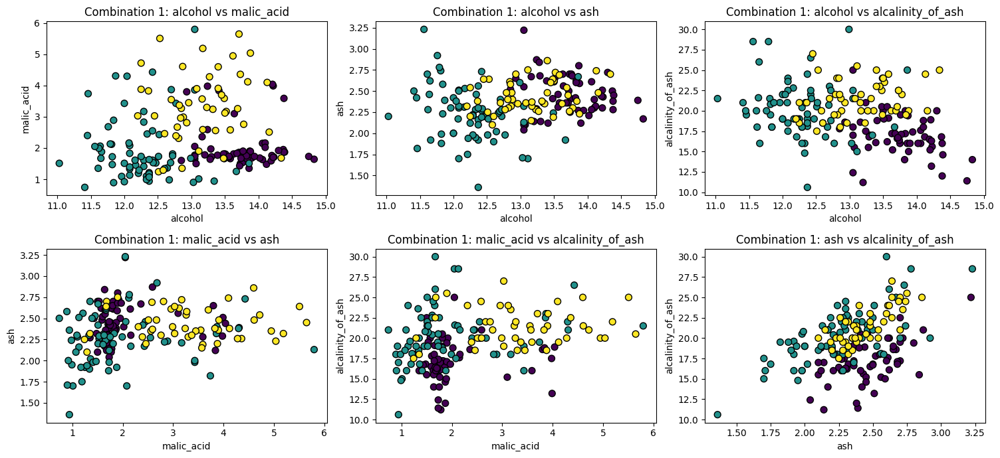

In [45]:
# Plot combinations of original features in 2D
plt.figure(figsize=(15, 7))

# Plot combination 1 (sepal length vs sepal width)
plt.subplot(2, 3, 1)
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+wine.feature_names[0] + ' vs ' + wine.feature_names[1])
plt.xlabel(wine.feature_names[0])
plt.ylabel(wine.feature_names[1])

# Plot combination 2 (sepal length vs petal length)
plt.subplot(2, 3, 2)
plt.scatter(X[:, 0], X[:, 2], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+wine.feature_names[0] + ' vs ' + wine.feature_names[2])
plt.xlabel(wine.feature_names[0])
plt.ylabel(wine.feature_names[2])

# Plot combination 3 (sepal length vs petal width)
plt.subplot(2, 3, 3)
plt.scatter(X[:, 0], X[:, 3], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+wine.feature_names[0] + ' vs ' + wine.feature_names[3])
plt.xlabel(wine.feature_names[0])
plt.ylabel(wine.feature_names[3])

plt.subplot(2, 3, 4)
plt.scatter(X[:, 1], X[:, 2], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+wine.feature_names[1] + ' vs ' + wine.feature_names[2])
plt.xlabel(wine.feature_names[1])
plt.ylabel(wine.feature_names[2])

# Plot combination 2 (sepal length vs petal length)
plt.subplot(2, 3, 5)
plt.scatter(X[:, 1], X[:, 3], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+wine.feature_names[1] + ' vs ' + wine.feature_names[3])
plt.xlabel(wine.feature_names[1])
plt.ylabel(wine.feature_names[3])

# Plot combination 3 (sepal length vs petal width)
plt.subplot(2, 3, 6)
plt.scatter(X[:, 2], X[:, 3], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+wine.feature_names[2] + ' vs ' + wine.feature_names[3])

plt.xlabel(wine.feature_names[2])
plt.ylabel(wine.feature_names[3])

plt.tight_layout()
plt.show()

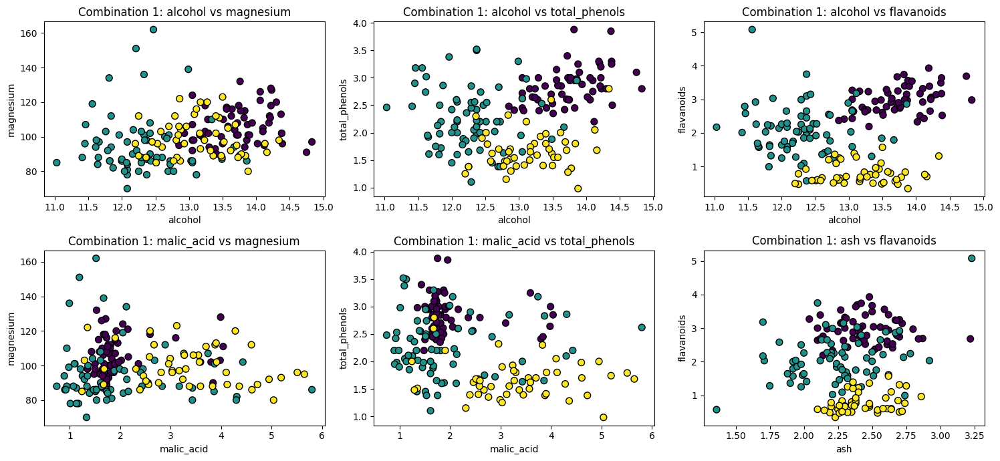

In [46]:
# Plot combinations of original features in 2D
plt.figure(figsize=(15, 7))

# Plot combination 1 (sepal length vs sepal width)
plt.subplot(2, 3, 1)
plt.scatter(X[:, 0], X[:, 4], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+wine.feature_names[0] + ' vs ' + wine.feature_names[4])
plt.xlabel(wine.feature_names[0])
plt.ylabel(wine.feature_names[4])

# Plot combination 2 (sepal length vs petal length)
plt.subplot(2, 3, 2)
plt.scatter(X[:, 0], X[:, 5], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+wine.feature_names[0] + ' vs ' + wine.feature_names[5])
plt.xlabel(wine.feature_names[0])
plt.ylabel(wine.feature_names[5])

# Plot combination 3 (sepal length vs petal width)
plt.subplot(2, 3, 3)
plt.scatter(X[:, 0], X[:, 6], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+wine.feature_names[0] + ' vs ' + wine.feature_names[6])
plt.xlabel(wine.feature_names[0])
plt.ylabel(wine.feature_names[6])

plt.subplot(2, 3, 4)
plt.scatter(X[:, 1], X[:, 4], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+wine.feature_names[1] + ' vs ' + wine.feature_names[4])
plt.xlabel(wine.feature_names[1])
plt.ylabel(wine.feature_names[4])

# Plot combination 2 (sepal length vs petal length)
plt.subplot(2, 3, 5)
plt.scatter(X[:, 1], X[:, 5], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+wine.feature_names[1] + ' vs ' + wine.feature_names[5])
plt.xlabel(wine.feature_names[1])
plt.ylabel(wine.feature_names[5])

# Plot combination 3 (sepal length vs petal width)
plt.subplot(2, 3, 6)
plt.scatter(X[:, 2], X[:, 6], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Combination 1: '+wine.feature_names[2] + ' vs ' + wine.feature_names[6])

plt.xlabel(wine.feature_names[2])
plt.ylabel(wine.feature_names[6])

plt.tight_layout()
plt.show()

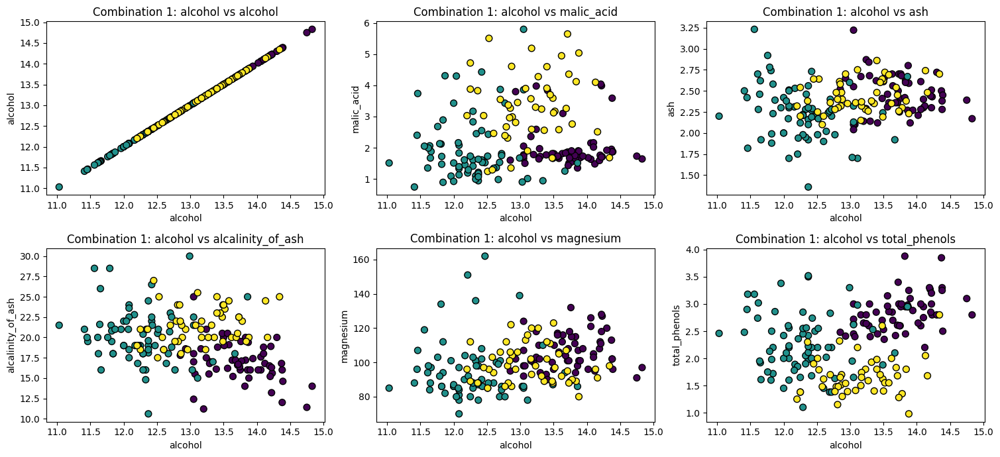

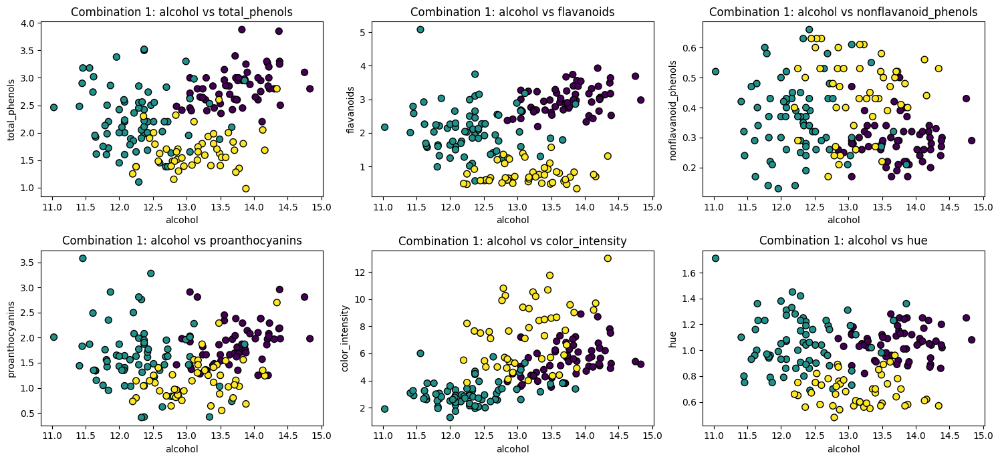

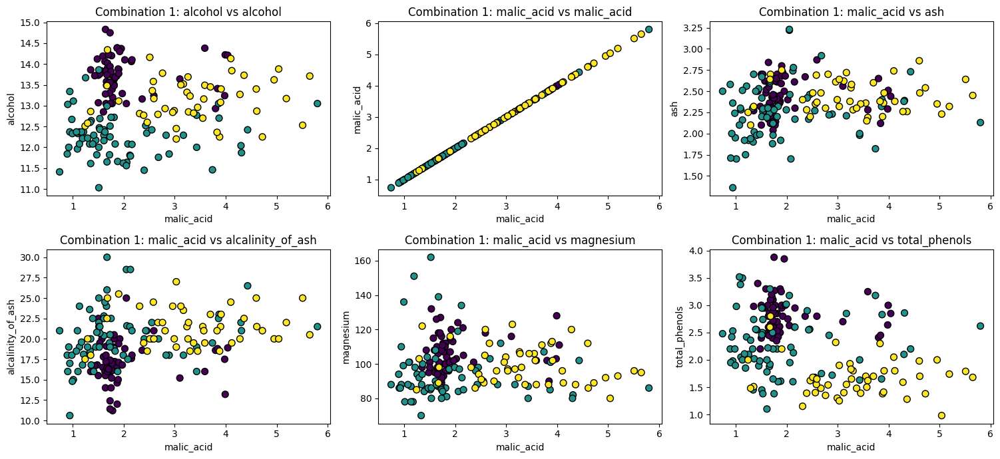

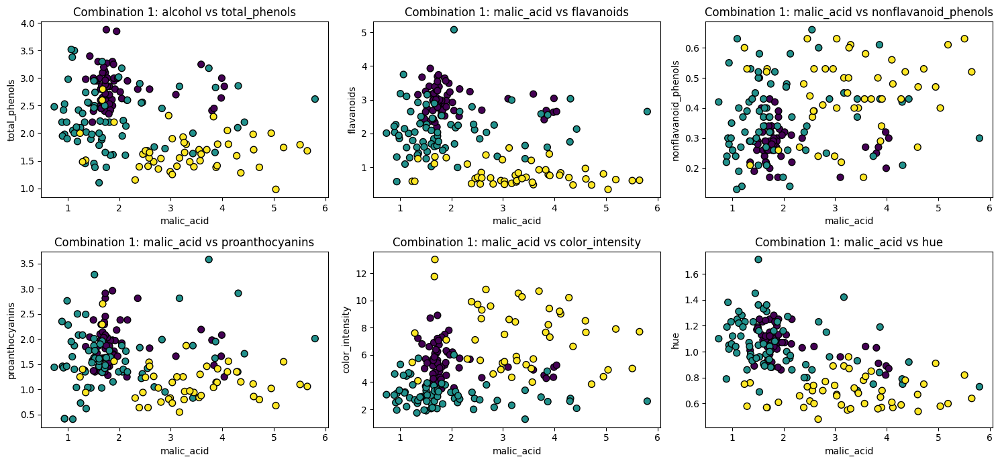

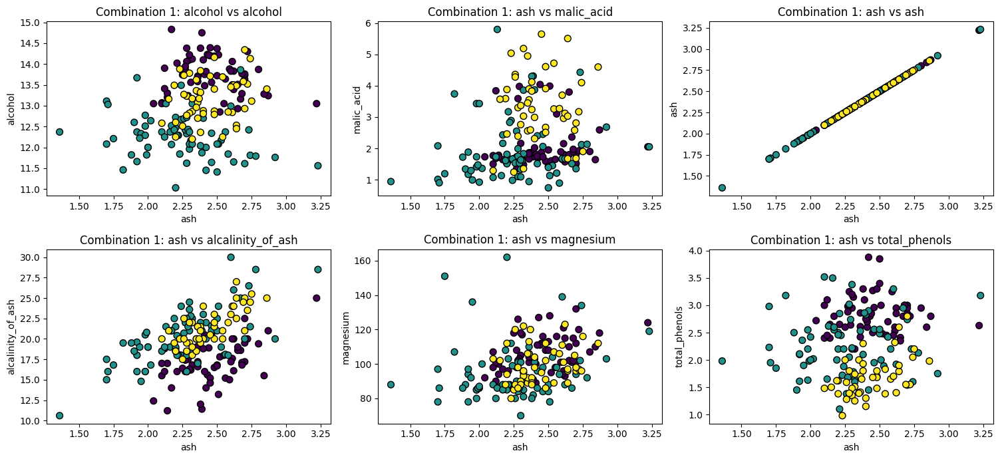

...

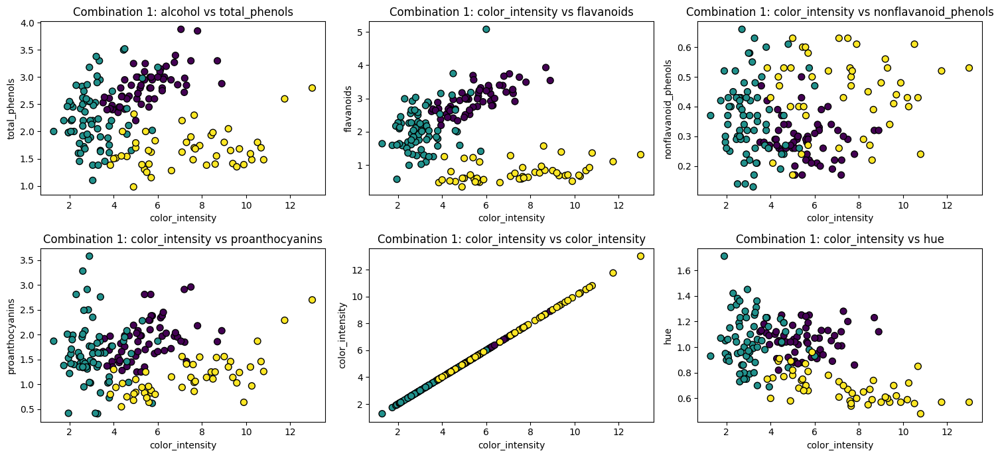

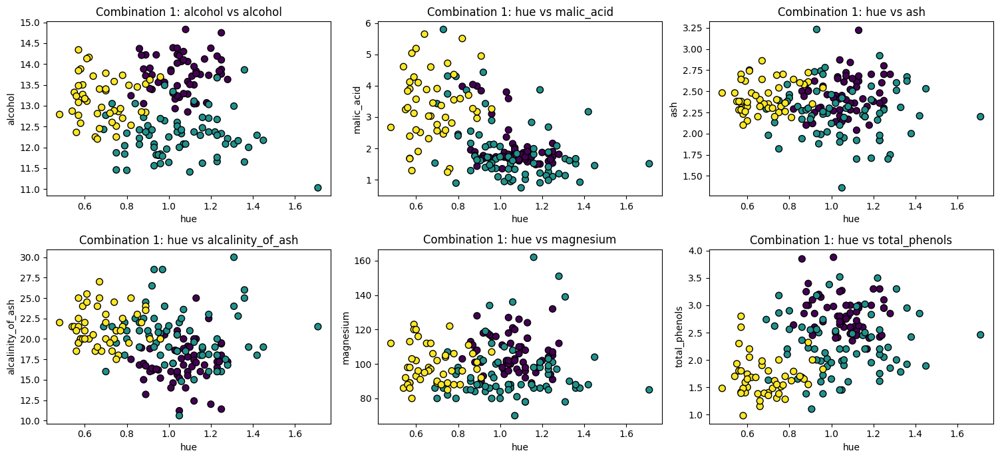

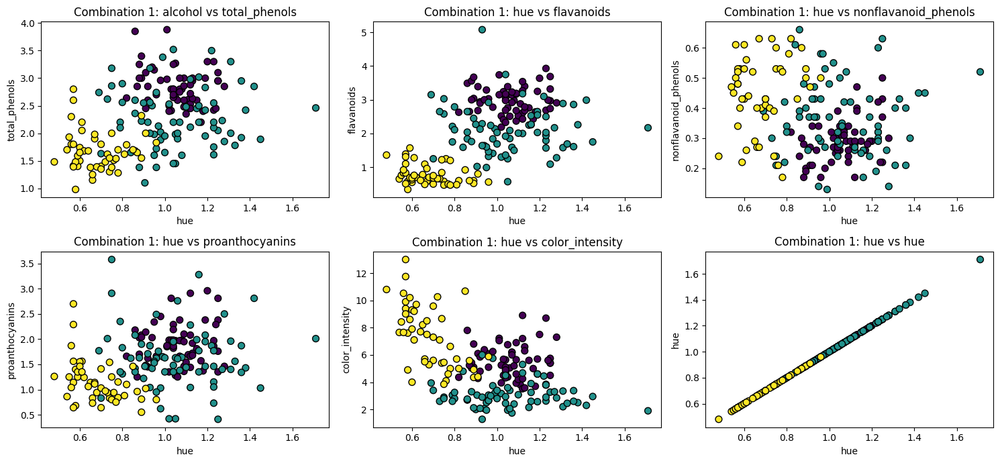

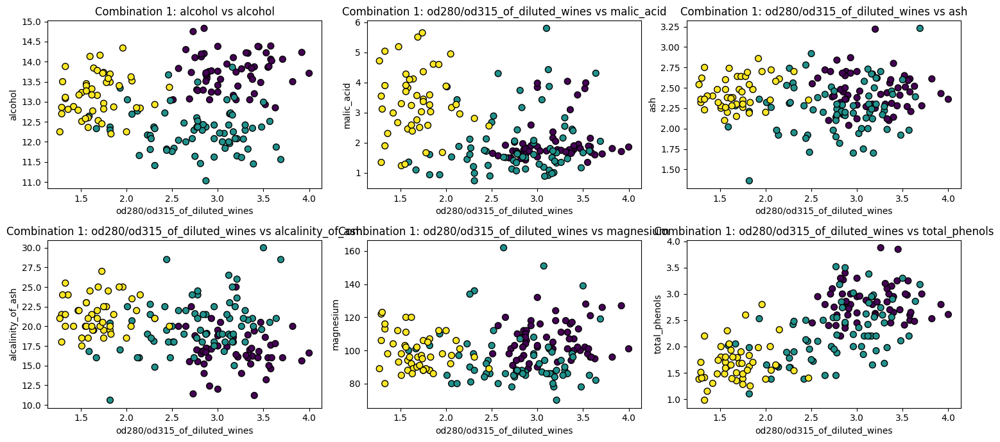

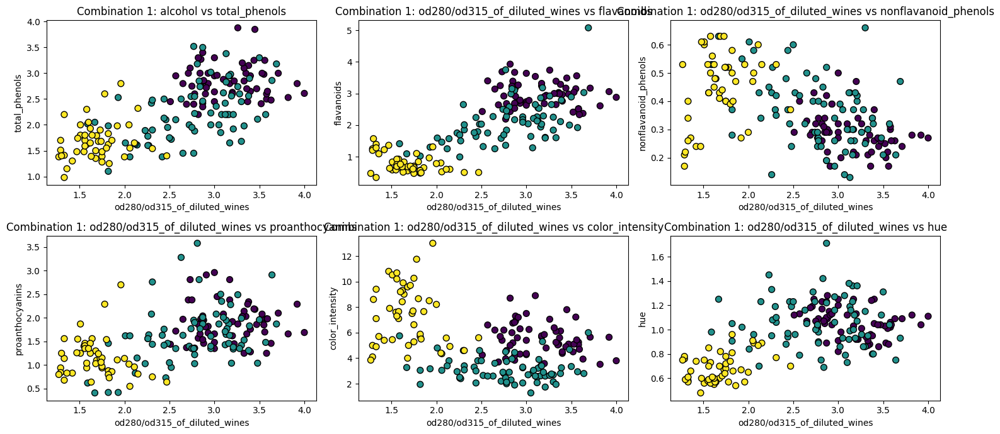

In [51]:
i = 0
while (i < 12):
  j = 0
  while (j < 10):

    # Plot combinations of original features in 2D
    plt.figure(figsize=(15, 7))

    # Plot combination 1 (sepal length vs sepal width)
    plt.subplot(2, 3, 1)
    plt.scatter(X[:, i], X[:, j], c=y, cmap='viridis', edgecolor='k', s=50)
    plt.title('Combination 1: '+wine.feature_names[0] + ' vs ' + wine.feature_names[j])
    plt.xlabel(wine.feature_names[i])
    plt.ylabel(wine.feature_names[j])

    # Plot combination 2 (sepal length vs petal length)
    plt.subplot(2, 3, 2)
    plt.scatter(X[:, i], X[:, j+1], c=y, cmap='viridis', edgecolor='k', s=50)
    plt.title('Combination 1: '+wine.feature_names[i] + ' vs ' + wine.feature_names[j+1])
    plt.xlabel(wine.feature_names[i])
    plt.ylabel(wine.feature_names[j+1])

    # Plot combination 3 (sepal length vs petal width)
    plt.subplot(2, 3, 3)
    plt.scatter(X[:, i], X[:, j+2], c=y, cmap='viridis', edgecolor='k', s=50)
    plt.title('Combination 1: '+wine.feature_names[i] + ' vs ' + wine.feature_names[j+2])
    plt.xlabel(wine.feature_names[i])
    plt.ylabel(wine.feature_names[j+2])

    plt.subplot(2, 3, 4)
    plt.scatter(X[:, i], X[:, j+3], c=y, cmap='viridis', edgecolor='k', s=50)
    plt.title('Combination 1: '+wine.feature_names[i] + ' vs ' + wine.feature_names[j+3])
    plt.xlabel(wine.feature_names[i])
    plt.ylabel(wine.feature_names[j+3])

    # Plot combination 2 (sepal length vs petal length)
    plt.subplot(2, 3, 5)
    plt.scatter(X[:, i], X[:, j+4], c=y, cmap='viridis', edgecolor='k', s=50)
    plt.title('Combination 1: '+wine.feature_names[i] + ' vs ' + wine.feature_names[j+4])
    plt.xlabel(wine.feature_names[i])
    plt.ylabel(wine.feature_names[j+4])

    # Plot combination 3 (sepal length vs petal width)
    plt.subplot(2, 3, 6)
    plt.scatter(X[:, i], X[:, j+5], c=y, cmap='viridis', edgecolor='k', s=50)
    plt.title('Combination 1: '+wine.feature_names[i] + ' vs ' + wine.feature_names[j+5])

    plt.xlabel(wine.feature_names[i])
    plt.ylabel(wine.feature_names[j+5])
    j = j + 5
    plt.tight_layout()
    plt.show()
  i = i + 1

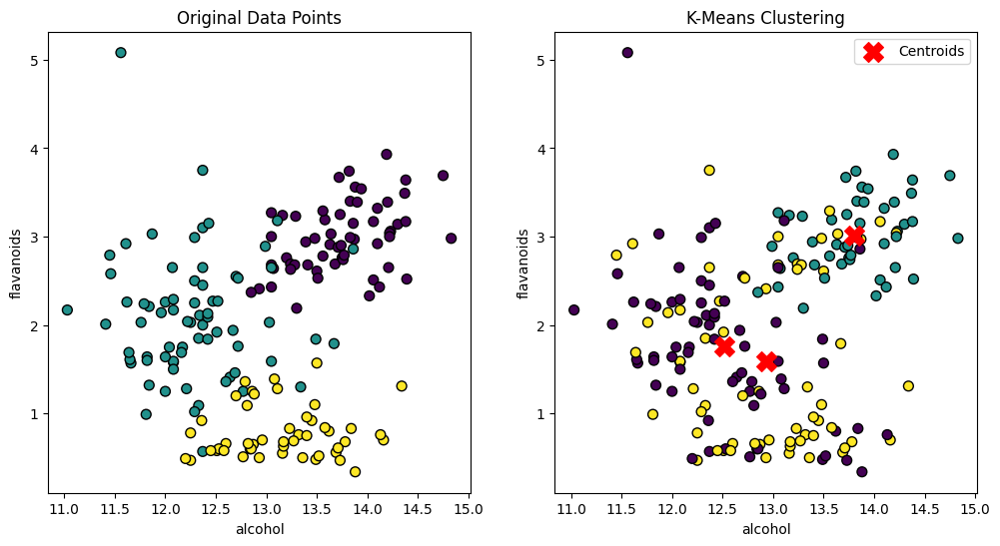

In [55]:

# Plot the original data points with colors based on the true labels
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(X[:, 0], X[:, 6], c=y, cmap='viridis', edgecolor='k', s=50)
plt.title('Original Data Points')

plt.xlabel(wine.feature_names[0])
plt.ylabel(wine.feature_names[6])

# Plot the data points with colors based on the cluster assignments from k-means
plt.subplot(1, 2, 2)
plt.scatter(X[:, 0], X[:, 6], c=labels, cmap='viridis', edgecolor='k', s=50)
plt.scatter(centroids[:, 0], centroids[:, 6], c='red', marker='X', s=200, label='Centroids')
plt.title('K-Means Clustering')

plt.xlabel(wine.feature_names[0])
plt.ylabel(wine.feature_names[6])
plt.legend()

plt.show()
